In [1]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import get_window
import sys, os
sys.path.append('../software/models/')
sys.path.append('../software/transformations/')
import utilFunctions as UF
import stft as STFT
import hpsModel as HPS
import hpsTransformations as HPST
import harmonicTransformations as HT
import IPython.display as ipd
from scipy.signal import resample
from scipy.ndimage.filters import uniform_filter1d


In [2]:
# Custom Functions

def fade(x, start_dur, end_dur):
    """Apply a fade in and fadeout to an audio signal
    
    Args:
    x (numpy array): input signal
    start_dur (float) [0,1]: duration of the fade-in relative to the signal length
    end_dur (float) [0,1]: duration of the fade-out relative to the signal length
    
    Returns:
    y (numpy array): signal with fade applied
    """ 
    end = len(x)                             # end of the signal
    fo_length = int(end_dur*end)             # length of fade out in samples
    fo_start = end - fo_length               # fade out start
     
    fi_length = int(start_dur*end)           # length of fade in in samples
    
    
    # compute linear fade out curves
    fi_curve = np.linspace(0.0, 1.0, fi_length)
    fo_curve = np.linspace(1.0, 0.0, fo_length)
    
    # apply the curves
    y = np.zeros(len(x))
    y[:fi_length] = x[:fi_length] * fi_curve
    y[fi_length:fo_start] = x[fi_length:fo_start]
    y[fo_start:end] = x[fo_start:end] * fo_curve
    
    return y

/tmp/ipykernel_84394/1100419759.py:38: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  plt.pcolormesh(frmTime, binFreq, np.transpose(mX[:,:int(N*maxplotfreq/fs+1)]))


Text(0.5, 1.0, 'magnitude spectrogram')

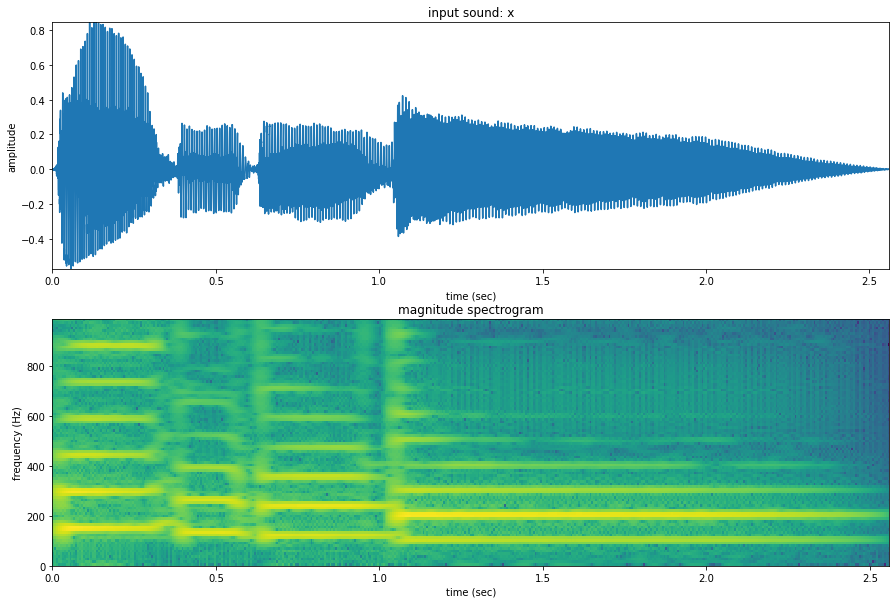

In [3]:
# Listening to the sound and visualising the waveform and STFT

input_file = 'bass-phrase.wav'

### set parameters
window = 'hamming'
M = 4001
N = 4096
H = 256


# STFT
fs, x = UF.wavread(input_file)                             # read file
w = get_window(window, M, fftbins=True)                    # get window
mX, pX = STFT.stftAnal(x, w, N, H)                         # compute STFT

# play audio
ipd.display(ipd.Audio(data=x, rate=fs))                    
 
# plots
plt.figure(figsize=(15, 10))
maxplotfreq = 1000.0

# plot input sound

plt.subplot(2,1,1)
plt.plot(np.arange(x.size)/float(fs), x)
plt.axis([0, x.size/float(fs), min(x), max(x)])
plt.ylabel('amplitude')
plt.xlabel('time (sec)')
plt.title('input sound: x')

# plot magnitude spectrogram
plt.subplot(2,1,2)
numFrames = int(mX[:,0].size)
frmTime = H*np.arange(numFrames)/float(fs)
binFreq = fs*np.arange(N*maxplotfreq/fs)/N
plt.pcolormesh(frmTime, binFreq, np.transpose(mX[:,:int(N*maxplotfreq/fs+1)]))
plt.xlabel('time (sec)')
plt.ylabel('frequency (Hz)')
plt.title('magnitude spectrogram')

## Sound Description 

The sound is the following short phrase played on a fretless bass - https://freesound.org/people/emirdemirel/sounds/411903/

### Preprocessing 

A 2.5 second segment is taken and a short fade-in and fade-out is added so that the first and last samples are zero. It's made sure that the fade-in doesn't affect the attack of the first note. 

### Segment Selection 

The segment is selected such that each of the notes are played differently to ensure that the segment is representative of the different kinds of sounds that can be produced on a fretless bass. 

The first note is picked loudly and is very bright because of the buzz against the fretboard. The rest of the notes are softer and have fewer high harmonics. These notes differ in note lengths - the 2nd note is almost stacatto, the 3rd is a short sustained note and the last note is a long sustained note. 

### Spectrogram features 

The lowest note is slightly sharper than G2 (98 Hz). This will inform the window size as well as the lowest f0 if sinusoidal or harmonic models are used. The highest note is D3 (147 Hz). The signal is harmonic but there are clear stochastic regions at the beginning and end of notes which can be seen in the smearing of the STFT at the transients. So reconstructing the signal using only a harmonic model will result in losing the characteristics of the attack.  


## Part 2 (b)

### Harmonic + Stochastic Model

This model is selected because while the fretless bass is a clearly harmonic instrument, the transients have a stochastic element to them as can be seen in the spectrogram. This model would also allow easy frequency scaling which would be necessary to make music that has harmonic or melodic content. Time stretching can be used to modify the attacks of the stochastic component which can be used as percussive sounds giving us a wider sonic pallete to play with.  

In [4]:
# Separate harmonic and stochastic components

input_file = 'bass-phrase.wav'
window ='hamming'
M = 2001
N = 2048
t = -90
minSineDur = 0.1
nH = 75
minf0 = 85
maxf0 = 170
f0et = 9
harmDevSlope = 0.02
stocf = 0.2
Ns = 512
H = 128

(fs, x) = UF.wavread(input_file)
w = get_window(window, M, fftbins=True)
hfreq, hmag, hphase, stocEnv = HPS.hpsModelAnal(x, fs, w, N, H, t, nH, minf0, maxf0, f0et, harmDevSlope, minSineDur, Ns, stocf)
y, yh, yst = HPS.hpsModelSynth(hfreq, hmag, hphase, stocEnv, Ns, H, fs)

print("Original Sound")
ipd.display(ipd.Audio(data=x, rate=fs))
print("Harmonic Part")
ipd.display(ipd.Audio(data=yh, rate=fs))
print("Stochastic Part")
ipd.display(ipd.Audio(data=yst, rate=fs))
print("Reconstruction")
ipd.display(ipd.Audio(data=y, rate=fs))



Original Sound


Harmonic Part


Stochastic Part


Reconstruction


### Analysis + Synthesis Results 

As expected, the harmonic + stochastic model was adequate for the analysis. The stochastic component of the transients is effectively separated from the harmonic component and resynthesis is faithful to the original sound. The representation is not very compact as the number of harmonics chosen is high. The reason for choosing a high number of harmonics is that the sound has very low values for f0 and hence has many harmonics in the perceptually relevant region (below 6 KHz). 

In [5]:
# separate the 4 notes 
notes  =  {"bright": x[:int(0.35*fs)],
           "short"  : x[int(0.4*fs): int(0.57*fs)],
           "medium" : x[int(0.624*fs) :int(0.92*fs)], 
           "long"   : x[int(fs):int(2.5*fs)]}

## Creating sounds

The following sounds are created:

1. **Kick Drum** - Two transformations are used

    1. Stochastic component of one of the notes is taken and is pitched down by time scaling and resampling. A low pass filter is also applied using running mean to remove high frequency noise. This gives the kick its transient and defines its attack. 
    2. To add low end to the kick, the frequency of the bass is scaled down two octaves (roughly in the 30-40 Hz region) and this sound is also low passed to remove the overtones so that there is no clear sense of pitch in the sound and it only adds the sub-bass frequencies. 
    
    A fade in and out is added to the sounds and then the sounds are layered together to create the kick sound. 


2. **Snare Drum** - Two transformations are used

    1. The transient from the stochastic component of the first (bright) note is time stretched to make the attack sharper. This note has a lot of the high frequency content that gives clarity to the sound of the snare. 
    
    2. The last (long) note is also similary time streched to make the attack shorter. Because it was a longer sound, it could be time streched to a much larger extend and so resulted in a very well defined and quick tranient. 
    
    These two sounds were also low passed and fades were added. Then they were layered similarly to the kick sound. 
    

3. **Hi-hat** - A hihat sound is created pitching up the stochastic component and time stretching it to make the attack shorter. It is also low passed using a running mean to mellow down the harsh sound. 


4. **Melodic/Harmonic instrument** - The last sustained long note of the bass is used to generate all the melodic and harmonic content. It is scaled in frequency and time as required for every note. 

Kick Drum Sound


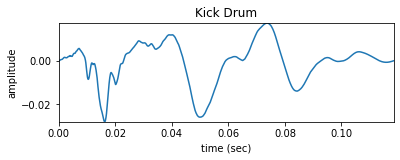

In [6]:
############################################
#                  Kick Drum               #
############################################

kick_src = notes["medium"]

# HPS analysis
hfreq, hmag, hphase, stocEnv = HPS.hpsModelAnal(kick_src, fs, w, N, H, t, nH, minf0, maxf0, f0et, harmDevSlope, minSineDur, Ns, stocf)

### Transform 1 - shift the stochastic component down in frequency by time scaling and resampling

# define the transformation
timeScaling = np.array([0, 0, 1, 0.2])
Ns = 512
H = 128

yhfreq, yhmag, ystocEnv = HPST.hpsTimeScale(hfreq, hmag, stocEnv, timeScaling)    # time scaling the sound
_, _, yst1 = HPS.hpsModelSynth(yhfreq, yhmag, np.array([]), ystocEnv, Ns, H, fs)  # synthesis 
kick_st = resample(yst1, len(kick_src))                                           # resampling to original length
kick_lp = uniform_filter1d(kick_st, size=10, mode="nearest")                      # low-pass filter (by using running mean)

kick_att = kick_lp[:int(len(kick_lp)*0.4)]                                        # take the first half of the soun
                                                                                  #(the second half is mostly noise)

### Transform 2 - pitch down the harmonic component and layer with the stochastic attack for sub-bass frequencies

# define the transformation
freqScaling = np.array([0, 0.25, 1, 0.25])
freqStretching = np.array([0,1,1,1])
timbrePreservation = 0
hfreqt, hmagt = HT.harmonicFreqScaling(hfreq, hmag,                      
                                       freqScaling, freqStretching,
                                       timbrePreservation, fs)                    # frequency scaling (pitch down)
y2, _, _ = HPS.hpsModelSynth(hfreqt, hmagt, np.array([]), stocEnv, Ns, H, fs)     # synthesis 
kick_sub = uniform_filter1d(y2, size=2500, mode="nearest")                        # low-pass filter 
kick_sub = kick_sub[:len(kick_att)]                                               # make it the same size at the attack

kick = (3*kick_sub + kick_att)/4                                                  # layer the attack with the sub
kick = fade(kick, 0.1, 0.5)                                                       # fadeout to avoid popping sounds

# play the kick sound
print("Kick Drum Sound")
ipd.display(ipd.Audio(data=kick, rate=fs))

# plot the kick sound
plt.subplot(2,1,1)
plt.plot(np.arange(kick.size)/float(fs), kick)
plt.axis([0, kick.size/float(fs), min(kick), max(kick)])
plt.ylabel('amplitude')
plt.xlabel('time (sec)')
plt.title('Kick Drum')
plt.show()

Snare Drum Sound


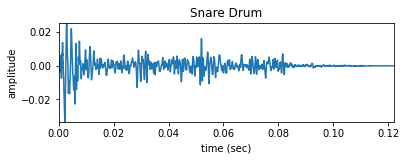

In [7]:
############################################
#                 Snare Drum               #
############################################

# Source sound 1 
snare_src1 = notes["bright"]

# HPS analysis
hfreq, hmag, hphase, stocEnv = HPS.hpsModelAnal(snare_src1, fs, w, N, H, t, nH, minf0, maxf0, f0et, harmDevSlope, minSineDur, Ns, stocf)

### Transform 1 - Time scale to make the attack quicker (use only the stochastic part)
timeScaling = np.array([0, 0, 1, 0.25])
Ns = 512
H = 128

yhfreq, yhmag, ystocEnv = HPST.hpsTimeScale(hfreq, hmag, stocEnv, timeScaling)         # time scaling the sound
_, _, snare_st = HPS.hpsModelSynth(yhfreq, yhmag, np.array([]), ystocEnv, Ns, H, fs)   # synthesis 
snare_lp = uniform_filter1d(snare_st, size=5, mode="nearest")                          # mild low-pass filter 
snare1 = fade(snare_lp, 0.01, 0.3)                                                     # fade in and out


# Source sound 2
snare_src2 = notes["long"]

# HPS analysis
hfreq, hmag, hphase, stocEnv = HPS.hpsModelAnal(snare_src2, fs, w, N, H, t, nH, minf0, maxf0, f0et, harmDevSlope, minSineDur, Ns, stocf)

### Transform 2 - Time scale to make the attack quicker 
timeScaling = np.array([0, 0, 1, 0.08])

yhfreq, yhmag, ystocEnv = HPST.hpsTimeScale(hfreq, hmag, stocEnv, timeScaling)         # time scaling the sound
_, _, snare_st = HPS.hpsModelSynth(yhfreq, yhmag, np.array([]), ystocEnv, Ns, H, fs)   # synthesis 
snare2 = fade(snare_st, 0.01, 0.3)                                                     # fade in and out


# layer the snare sounds (second sample is twice as loud as the first)
diff = len(snare2) - len(snare1)                                       # make sure both samples are the same length
snare = (np.pad(snare1, (0, diff), "constant") + 2*snare2)/3           # add them together

# play the snare sound
print("Snare Drum Sound")
ipd.display(ipd.Audio(data=snare, rate=fs))

# plot the snare sound
plt.subplot(2,1,1)
plt.plot(np.arange(snare.size)/float(fs), snare)
plt.axis([0, snare.size/float(fs), min(snare), max(snare)])
plt.ylabel('amplitude')
plt.xlabel('time (sec)')
plt.title('Snare Drum')
plt.show()

Hi-Hat Sound


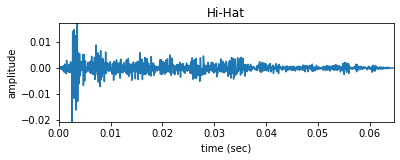

In [8]:
############################################
#                  Hi-Hats                 #
############################################

hat_src = notes["short"]

# HPS analysis
hfreq, hmag, hphase, stocEnv = HPS.hpsModelAnal(hat_src, fs, w, N, H, t, nH, minf0, maxf0, f0et, harmDevSlope, minSineDur, Ns, stocf)

### Transform - Time scale to make it longer
# define the transformation
timeScaling = np.array([0, 0,  1, 3])
Ns = 512
H = 128

yhfreq, yhmag, ystocEnv = HPST.hpsTimeScale(hfreq, hmag, stocEnv, timeScaling)         # time scaling the sound
_, _, hat_st = HPS.hpsModelSynth(yhfreq, yhmag, np.array([]), ystocEnv, Ns, H, fs)     # synthesis 
hat_st = resample(hat_st, len(hat_st)//8)                                              # resampling to original length
hat_lp = uniform_filter1d(hat_st, size=4, mode="nearest")                              # low-pass filter 
hat = fade(hat_lp, 0.2, 0.96)                                                          # fade in and out


# play the hi-hat sound
print("Hi-Hat Sound")
ipd.display(ipd.Audio(data=hat, rate=fs))

# plot the snare sound
plt.subplot(2,1,1)
plt.plot(np.arange(hat.size)/float(fs), hat)
plt.axis([0, hat.size/float(fs), min(hat), max(hat)])
plt.ylabel('amplitude')
plt.xlabel('time (sec)')
plt.title('Hi-Hat')
plt.show()

In [9]:
# Melodic Instrument

src = notes["long"]

# HPS analysis
hfreq, hmag, hphase, stocEnv = HPS.hpsModelAnal(src, fs, w, N, H, t, nH, minf0, maxf0, f0et, harmDevSlope, minSineDur, Ns, stocf)
src_params = (hfreq, hmag, hphase, stocEnv)

def generate_note(src_params, octave_shift, semitone_shift,
                  ts_factor = None, fst_factor = 1, timbrePreservation = 0, fs = 44100):
    """Shifts a source note by given number of semitones and octaves
    
    Args:
    src_params: hfreq, hmag, hphase, stocEnv (results of HPS analysis of the source sound)
    octave_shift (int): number of octaves to shift
    semitone_shift (int): number of semitones to shift
    ts_factor (float): Time scaling factor. If not given, no time scaling will be applied.
    fst_factor (float): frequency scaling factor 
    timbrePreservation(0, 1): whether to preserve timbre while frequency scaling
    fs(int): frame rate
    
    Returns:
    (y, yh, yst): the generated note and it's harmonic and stochastic components
    """
    Ns = 512
    H = 128
    hfreq, hmag, hphase, stocEnv = src_params
    semitone_shift+= octave_shift*12                        # total number of semitones to shift   
    
    # define the transformation
    freqScaling = np.array([0, 2**(semitone_shift/12), 1, 2**(semitone_shift/12)])
    freqStretching = np.array([0,fst_factor,1,fst_factor])
    hfreqt, hmagt = HT.harmonicFreqScaling(hfreq, hmag,                      
                                           freqScaling, freqStretching,
                                           timbrePreservation, fs)                    # frequency scaling (pitch down)
    if ts_factor:
        timeScaling = np.array([0, 0, 1, ts_factor])
        # time scaling the sound
        hfreqt, hmagt, stocEnv = HPST.hpsTimeScale(hfreqt, hmagt, stocEnv, timeScaling)

    # synthesis from the trasformed hps representation 
    y, yh, yst = HPS.hpsModelSynth(hfreqt, hmagt, np.array([]), stocEnv, Ns, H, fs)   # synthesis 
    
    return (y, yh, yst)


    

## Putting it together

This is a minimal arrangement of **"Christmas Time is Here"** originally by Vince Guaraldi. There are 4 components to this piece - drums, bass, melody, and harmony. 

The drums follow a very simple pattern in a 3/4 rhythm. Hi-hats on every quarter note, and kick and snare in a very conventional fashion. Every other measure, there is an an anticipated kick drum to add a little excitement to the rhythm.

The bass slavishly follows the chord chages and is synced up to the drums. Individual bass notes are generated by pitch shifting the long sustained note from the original track and time stretching it to fit the duration according to the tempo of the piece. 

The melody is very similarly generated as the bass only pitched a couple octaves higher. 

The chords are also generated in a similar manner, but they are played in a way that simulates a piano player rolling the chords, or a slow strum of a guitar. This is achieved by introducing a small delay between consecutive notes of the chords. The timing is also a little loose (simulated by shifting the starting points of chords by small amounts). This gives the arrangement, despite the very mechanical sounds, a slightly more human feel. 

### Drums

In [10]:
# define parameters of the piece
bpm = 80
measures = 8
fs = 44100
samples_per_beat = fs/(bpm/60)

canvas = np.zeros((int(3*8/(bpm/60)*fs)))               # initialise a blank canvas for the length of the piece

# add the kick and the snare
for i in range(measures):
    if i%2 == 0:                                        # add kick on even beat indices
        start = int(i*3*samples_per_beat)               # sample to start the sound
        canvas[start:start+len(kick)]+= kick*3          # add the kick (amplified by a factor of 3)
        
        if i%4 != 0:                                    # anticipated kick every other time
            start = start - int(samples_per_beat/6)  
            canvas[start:start+len(kick)]+= kick
            
    if i%2 != 0:                                        # add snare on odd beat indices
        start = int(i*3*samples_per_beat)               # sample to start the sound
        canvas[start:start+len(snare)]+= snare*1.5      # add the snare (amplified by a factor of 1.5)
    
    

# add hi-hats
for i in range(measures*3):                             
    start = int(i*samples_per_beat)                     # sample to start the sound
    canvas[start:start+len(hat)]+= hat/4                # add the hihat (amplitude attenuated)
    

print("Drum Track")
ipd.display(ipd.Audio(data = canvas, rate = fs))



Drum Track


### Bass

In [11]:
"""
Chord Progression: Fmaj7   -   -   Eb13#11   -   -   Fmaj7   -   -   Eb13#11 
                   Bm7b5   -  Bbm7   Am7     -  G#m7  Gm7    -  C13   Fmaj7
"""

print("Adding the Bassline...")

# define the bassline in semitone shift and duration pairs (durations are in beats)
bassline = [(-2, 1), (5, 2), (-4, 1), (3, 2),(-2, 1), (5, 2), (-4, 1), (3, 2),
             (4, 2), (3, 1), (2, 2), (1, 1), (0, 2), (-7, 1), (-2, 3)]

src_length = len(notes["long"])                               # length of source sound in samples

pointer = 0                                                   # pointer to keep track of where to add next note
for bassnote in bassline:
    shift, beats = bassnote
    y, yh, yst = generate_note(src_params, 0, shift, ts_factor = beats*samples_per_beat/src_length)    # get note
    canvas[pointer : pointer + len(y)]+= y/30                                                     # add to canvas
    pointer += int(beats*samples_per_beat)                                                        # update pointer

ipd.display(ipd.Audio(data = canvas, rate = fs))


Adding the Bassline...


### Melody

In [12]:
"""
Melody: E  C  C        A  A                 E  C  C        A  A        
        _  -  _  -  _  -  _  -  _  -  _  -  _  -  _  -  _  -  _  -  _  -
        
        A  F  F        D  G  E  E        E  D  F  D        F  G
        _  -  _  -  _  -  _  -  _  -  _  -  _  -  _  -  _  -  _  -  _  -
                   
"""

print("Adding the Melody...")

# define the melody in semitone shift and duration pairs (durations are in eighth notes)
melody = [(9, 1),(5, 1), (5, 3), (2, 0.9), (2, 6.1),(9, 1),(5, 1), (5, 3), (2, 0.9), (2, 6.1),
         (2,1), (-2, 1), (-2, 3), (-5, 1), (0, 1), (-3, 1),(-3, 3), (-3, 1), (-5, 1), (-2, 1),(-5, 3), (-2, 1), (0, 3)]

src_length = len(notes["long"])

pointer = 0                                                   # pointer to keep track of where to add next note
for note in melody:
    shift, beats = note
    y, yh, yst = generate_note(src_params, 2, shift,
                               ts_factor = beats*samples_per_beat/2/src_length)                   # get note
    canvas[pointer : pointer + len(y)]+= yh/30                                                    # add to canvas
    pointer += int(beats*samples_per_beat/2)                                                      # update pointer

ipd.display(ipd.Audio(data = canvas, rate = fs))


Adding the Melody...


### Chords

In [13]:
"""
Chord Progression: Fmaj7   -   -   Eb13#11   -   -   Fmaj7   -   -   Eb13#11 
                   Bm7b5   -  Bbm7   Am7     -  G#m7  Gm7    -  C13   Fmaj7
"""

print("Adding the Chords...")

# define the chords in [notes] and duration pairs (durations are in eighth notes)
chords = [([-2, 2, 5, 9, 14], 2.9), ([0, 6, 10, 14], 2.9), ([-2, 2, 5, 9, 14], 3), ([0, 5, 6, 10, 14], 3),
          ([4, 7, 14], 2.2), ([3, 6, 13], 0.8), ([2, 5, 12], 2.2), ([1, 4, 11], 0.8), ([0, 3, 10], 2.2), ([0, 3, 6, 10], 0.8),
          ([-2, 2, 5, 9, 14], 1), ([10,14, 17, 21], 2)]
 
src_length = len(notes["long"])

pointer = 0                                                   # pointer to keep track of where to add next note
for chord  in chords:
    chord_tones, beats = chord
    for delay, shift in enumerate(chord_tones):
        y, yh, yst = generate_note(src_params, 1, shift,
                                   ts_factor = beats*samples_per_beat/src_length)            # get note
        
        canvas[pointer+delay*1000 : pointer + delay*1000 + len(y)]+= yh/180   # roll the chord (small delay b/w notes)                                              # add to canvas
    
    pointer += int(beats*samples_per_beat)                                    # update pointer

final_piece = fade(canvas, 0.01, 0.02)                                                     # fade in and out
ipd.display(ipd.Audio(data = final_piece, rate = fs))
print("Merry Christmas!")



Adding the Chords...


Merry Christmas!
